# Capstone: Detecting Aircraft from Satellite Imagery
## Part 2 - Preprocessing
---

## Problem Statement
GA pilots (both private license holders and students) thus need a way to monitor activity trends at Seletar Airport so as to better plan their flights to be more cost effective. 

## The Project
In this first iteration, the aim is to train an object detection model to accurately identify and locate aircraft within satellite images, achieving at least 0.75 mAP.

---

## Import Libraries

In [1]:
import os
import numpy as np
import pandas as pd
import random
import ast

from tqdm import tqdm
import shutil as sh
from sklearn.model_selection import GroupShuffleSplit 

import PIL
from PIL import ImageDraw, ImageFont
from IPython.display import Image, clear_output
import cv2

from pascal_voc_writer import Writer
import xml.etree.ElementTree as et

import image_bbox_slicer as ibs
import albumentations as alb

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# set random seeds for reproducibility
random.seed(8888)
np.random.seed(8888)

## Load Dataset

In [3]:
df = pd.read_csv('data/dataset.csv', 
                converters={'bbox': lambda x: ast.literal_eval(x.rstrip('\r\n'))})
df.head()

,image_id,class,bbox,width,height,area
0,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,Airplane,"(135, 522, 245, 600)",110,78,8580
1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,Airplane,"(1025, 284, 1125, 384)",100,100,10000
2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,Airplane,"(1058, 1503, 1130, 1568)",72,65,4680
3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,Airplane,"(813, 1518, 885, 1604)",72,86,6192
4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,Airplane,"(594, 938, 657, 1012)",63,74,4662


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3379 entries, 0 to 3378
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image_id  3379 non-null   object
 1   class     3379 non-null   object
 2   bbox      3379 non-null   object
 3   width     3379 non-null   int64 
 4   height    3379 non-null   int64 
 5   area      3379 non-null   int64 
dtypes: int64(3), object(3)
memory usage: 158.5+ KB


In [5]:
df.isnull().sum()

image_id    0
class       0
bbox        0
width       0
height      0
area        0
dtype: int64

## Train-Val-Test Split
Group up the annotations and split the dataset by images using GroupShuffleSplit. The dataset will first be split into train and test. Following that the newly obtained train dataset will be further split into train and validation.

In [6]:
# train-test split
splitter = GroupShuffleSplit(test_size=.20, n_splits=1, random_state = 88)
split = splitter.split(df, groups=df['image_id'])
train_inds, test_inds = next(split)

train = df.iloc[train_inds]
test = df.iloc[test_inds]

In [7]:
# train-val split
splitter = GroupShuffleSplit(test_size=.20, n_splits=1, random_state = 88)
split = splitter.split(train, groups=train['image_id'])
train_inds, val_inds = next(split)

val = train.iloc[val_inds]
train = train.iloc[train_inds]

In [8]:
train.reset_index(drop=True, inplace=True)
train.head()

,image_id,class,bbox,width,height,area
0,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,Airplane,"(135, 522, 245, 600)",110,78,8580
1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,Airplane,"(1025, 284, 1125, 384)",100,100,10000
2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,Airplane,"(1058, 1503, 1130, 1568)",72,65,4680
3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,Airplane,"(813, 1518, 885, 1604)",72,86,6192
4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,Airplane,"(594, 938, 657, 1012)",63,74,4662


In [9]:
val.reset_index(drop=True, inplace=True)
val.head()

,image_id,class,bbox,width,height,area
0,0641acc3-c0b9-4f9d-b0ba-7ad18aa08864.jpg,Airplane,"(171, 216, 242, 294)",71,78,5538
1,0641acc3-c0b9-4f9d-b0ba-7ad18aa08864.jpg,Airplane,"(406, 357, 472, 421)",66,64,4224
2,0641acc3-c0b9-4f9d-b0ba-7ad18aa08864.jpg,Airplane,"(617, 492, 673, 570)",56,78,4368
3,0641acc3-c0b9-4f9d-b0ba-7ad18aa08864.jpg,Airplane,"(678, 572, 733, 636)",55,64,3520
4,0641acc3-c0b9-4f9d-b0ba-7ad18aa08864.jpg,Airplane,"(737, 551, 807, 614)",70,63,4410


In [10]:
test.reset_index(drop=True, inplace=True)
test.head()

,image_id,class,bbox,width,height,area
0,f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg,Airplane,"(1379, 429, 1470, 531)",91,102,9282
1,f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg,Airplane,"(1627, 248, 1707, 345)",80,97,7760
2,f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg,Airplane,"(1707, 128, 1836, 262)",129,134,17286
3,f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg,Airplane,"(1860, 65, 1948, 163)",88,98,8624
4,f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg,Airplane,"(1782, 626, 1913, 763)",131,137,17947


## Write Files to Respective Folders

In [11]:
def folder_creation(dataframe, folder):
    image_list = dataframe.groupby('image_id')
    image_list = list(image_list.groups.keys())
    
    destination = os.path.join('data', 'split_images', folder)
    if not os.path.exists(destination):
        os.makedirs(destination)
        print(f'{destination} folder created')
    else:
        print('folder already exists')
    
    for i in range(len(image_list)):
        source = os.path.join('data', 'images', f'{image_list[i]}')
        sh.copy(source, destination)
    
    return image_list

In [12]:
train_images = folder_creation(train, 'train')
val_images = folder_creation(val, 'val')
test_images = folder_creation(test, 'test')

data\split_images\train folder created
data\split_images\val folder created
data\split_images\test folder created


## Tiling
The large resolution of the images (2560x2560) makes it taxing on GPU resources to handle model training. To aid the model's learning and speed up the training process of YOLOv7, images should ideally be around its original training resolution of 640x640.

Because the airplane targets on satellite images are very small, simply reducing the images' resolutions is far from ideal. A viable solution to this problem is tiling, which splits the large image up into pieces based on size or number of tiles. This not only make the targets clearer, but also reduce memory requirements for training larger batch sizes.

A useful library for this is image-bbox-slicer, which is capable of tiling images and retaining bounding boxes for the tiles. Two caveats for using it though:
1. Unable to specify threshold for discarding transformed bounding boxes
2. Only able to read annotations in Pascal VOC format

Other than that, the library works amazing and is truly a godsend for this project.

In [13]:
# function to create XML files with Pascal_VOC format annotations
def write_voc(image_list, folder):
    
    # create destination folder
    destination = os.path.join('data', 'split_labels_voc', folder)
    if not os.path.exists(destination):
        os.makedirs(destination)
        print(f'{destination} folder created')
    else:
        print('folder already exists')
    
    # for each image, instantiate XML Writer object
    for image in image_list:
        writer = Writer(os.path.join('data', 'image', image), 2560, 2560)
        image_annot = df[df['image_id']==image]['bbox'].tolist() # obtain list of all annotations for image 
        
        for annot in image_annot:
            xmin, ymin, xmax, ymax = annot # extract the coordinates
            writer.addObject(0,xmin,ymin,xmax,ymax) # add the bounding box to Writer
        
        writer.save(os.path.join(destination, f'{image.split(".")[0]}.xml'))

In [14]:
write_voc(train_images, 'train')
write_voc(val_images, 'val')
write_voc(test_images, 'test')

data\split_labels_voc\train folder created
data\split_labels_voc\val folder created
data\split_labels_voc\test folder created


In [15]:
# slice 'em up
for folder in ('train', 'val'):
    im_src = os.path.join('data', 'split_images', folder) # image source 
    an_src = os.path.join('data', 'split_labels_voc', folder) # annotation source
    im_dst = os.path.join('data', 'tiled_images', folder) # image destination
    an_dst = os.path.join('data', 'tiled_labels_voc', folder) # annotation destination
    
    # create folders
    if not os.path.exists(im_dst):
        os.makedirs(im_dst)
        print(f'{im_dst} folder created')
    else:
        print('folder already exists')

    if not os.path.exists(an_dst):
        os.makedirs(an_dst)
        print(f'{an_dst} folder created')
    else:
        print('folder already exists')
        
    slicer = ibs.Slicer() # instantiate Slicer object
    slicer.config_dirs(img_src=im_src, ann_src=an_src, img_dst=im_dst, ann_dst=an_dst) # specify source and destination directories
    slicer.keep_partial_labels = True # to keep or not keep partial labels
    slicer.ignore_empty_tiles = False # to keep or not keep empty tiles
    slicer.save_before_after_map = True # save a CSV file containing image-to-tile mappings
    
    slicer.slice_by_size(tile_size=(512,512), tile_overlap=0)

data\tiled_images\train folder created
data\tiled_labels_voc\train folder created
Obtained 1625 annotation slices!
Successfully saved the mapping between files before and after slicing at data\tiled_labels_voc\train
Obtained 1625 image slices!
Successfully saved the mapping between files before and after slicing at data\tiled_images\train
data\tiled_images\val folder created
data\tiled_labels_voc\val folder created
Obtained 425 annotation slices!
Successfully saved the mapping between files before and after slicing at data\tiled_labels_voc\val
Obtained 425 image slices!
Successfully saved the mapping between files before and after slicing at data\tiled_images\val


### Visualizing an Original Image and its Tiles

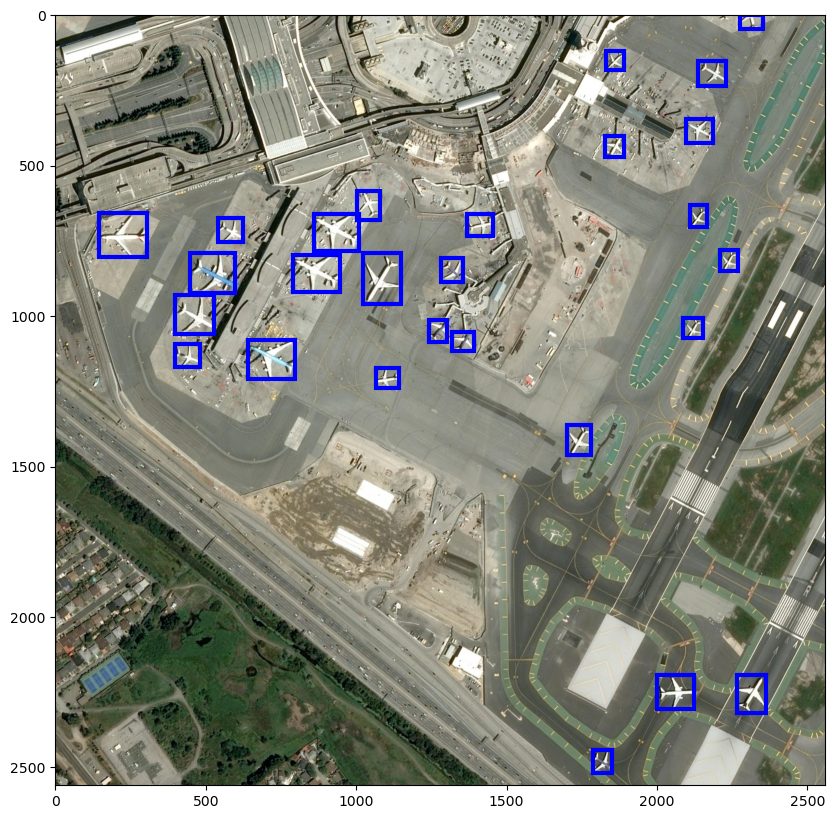

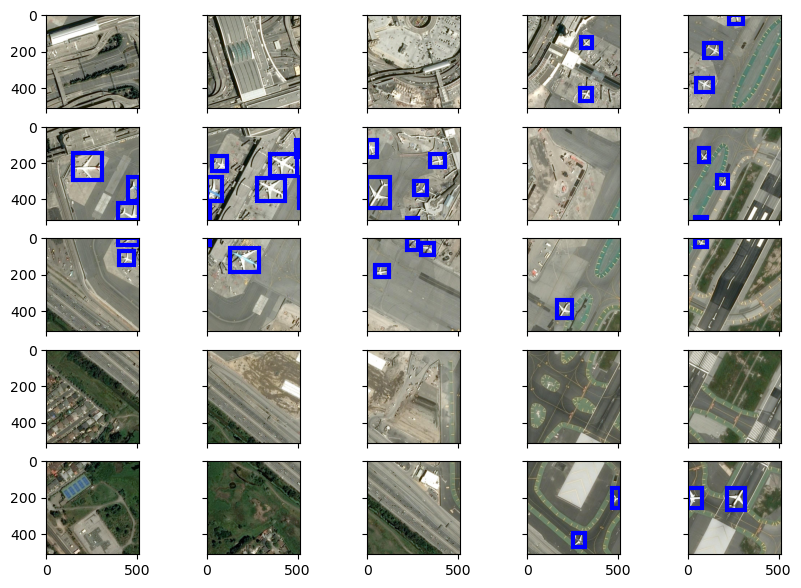

In [16]:
slicer.visualize_sliced_random()

Each image has been sliced into 25 smaller tiles of size 512x512, with the appropriate bounding boxes as well. Tiles without any aircraft will have a corresponding blank txt annotation file, serving as negative examples.

## Create Annotations TXT in YOLO Format from Pascal_VOC XML
The annotation format for YOLO differs
In yolo, a bounding box is represented by four values [x_center, y_center, width, height]. x_center and y_center are the normalized coordinates of the center of the bounding box.
width and height represent the width and the height of the bounding box. They are normalized as well. (source: [albumentations docs](https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/))

As the provided bounding box coordinates were in Pascal VOC format (Xmin, Ymin, Xmax, Ymax), there is a need to convert and create the relevant TXT files.

In [17]:
# code to extract information from xml files
def extract_info_from_xml(xml_file):
    root = et.parse(xml_file).getroot()
    # initialize dictionary to store informmation
    info_dict = {}
    info_dict['bboxes'] = []
    # parse the XML Tree
    for elem in root:
        # get the file name
        if elem.tag == "filename":
            info_dict['filename'] = elem.text
        # get the image size
        elif elem.tag == "size":
            image_size = []
            for subelem in elem:
                if subelem.tag == "width":
                    image_size.append(int(subelem.text))
                elif subelem.tag == "height":
                    image_size.append(int(subelem.text))
                info_dict['image_size'] = tuple(image_size)
        # get bounding box values
        elif elem.tag == "object":
            bbox = {}
            for subelem in elem:
                if subelem.tag == "name":
                    bbox["class"] = subelem.text
                elif subelem.tag == "bndbox":
                    for subsubelem in subelem:
                        bbox[subsubelem.tag] = float(subsubelem.text)
            info_dict['bboxes'].append(bbox)
    return info_dict

In [18]:
# dictionary that maps class names to IDs
class_name_to_id_mapping = {"Aircraft": 0}

# convert the info dict to the required yolo format and write it to disk
def convert_to_yolo(info_dict, folder):
    print_buffer = []
    # for each bounding box
    for b in info_dict["bboxes"]:
        b_center_x = (b["xmin"] + b["xmax"]) / 2
        b_center_y = (b["ymin"] + b["ymax"]) / 2
        b_width    = (b["xmax"] - b["xmin"])
        b_height   = (b["ymax"] - b["ymin"])
        # normalise the co-ordinates by the dimensions of the image
        image_w, image_h = info_dict["image_size"]
        b_center_x /= image_w
        b_center_y /= image_h
        b_width    /= image_w
        b_height   /= image_h
        # write the bbox details to the file
        print_buffer.append("{} {:.3f} {:.3f} {:.3f} {:.3f}".format(0, b_center_x, b_center_y, b_width, b_height))
    # name of the file which we have to save
    filetype_list = ["png","jpg","jpeg","webp"]
    file_ext = info_dict["filename"].split(".") #"png","jpg","jpeg","webp"
    
    try:
        if file_ext[-1] in filetype_list:
            save_file_name = os.path.join('data', 'yolo_labels', folder, info_dict["filename"].replace(file_ext[-1], "txt"))
    except:
        pass
    # print(info_dict["filename"])
    
    # save the annotation to disk
    # print("\n".join(print_buffer), file= open(save_file_name, "w"))
    with open(save_file_name, 'w') as f:
            f.write("\n".join(print_buffer))

In [19]:
# create folders
for folder in ['train', 'test', 'val']:
    im_dst = os.path.join('data', 'yolo_labels', folder)
    
    if not os.path.exists(im_dst):
        os.makedirs(im_dst)
        print(f'{im_dst} folder created')
    else:
        print('folder already exists')

data\yolo_labels\train folder created
data\yolo_labels\test folder created
data\yolo_labels\val folder created


In [20]:
# get the annotations in PASCAL_VOC format from the folder
train_yolo_annotations = [os.path.join('data/tiled_labels_voc/train', x) for x in os.listdir('data/tiled_labels_voc/train') if x[-3:] == "xml"]
# convert and save the annotations 
for ann in tqdm(train_yolo_annotations):
    info_dict = extract_info_from_xml(ann)
    convert_to_yolo(info_dict,folder='train')

100%|██████████| 1625/1625 [00:06<00:00, 265.29it/s]


In [21]:
# get the annotations in PASCAL_VOC format from the folder
val_yolo_annotations = [os.path.join('data/tiled_labels_voc/val', x) for x in os.listdir('data/tiled_labels_voc/val') if x[-3:] == "xml"]
# convert and save the annotations 
for ann in tqdm(val_yolo_annotations):
    info_dict = extract_info_from_xml(ann)
    convert_to_yolo(info_dict,folder='val')

100%|██████████| 425/425 [00:01<00:00, 267.63it/s]


In [22]:
# get the annotations in PASCAL_VOC format from the folder
test_yolo_annotations = [os.path.join('data/split_labels_voc/test', x) for x in os.listdir('data/split_labels_voc/test') if x[-3:] == "xml"]
# convert and save the annotations 
for ann in tqdm(test_yolo_annotations):
    info_dict = extract_info_from_xml(ann)
    convert_to_yolo(info_dict,folder='test')

100%|██████████| 21/21 [00:00<00:00, 207.87it/s]


In [23]:
def plot_bounding_box(image, annot_list):
    w, h = image.size
    
    plotted_image = PIL.ImageDraw.Draw(image)
    
    for annotation in annot_list:
        obj_cls = annotation[0]
        x_center = annotation[1]
        y_center = annotation[2]
        width = annotation[3]
        height = annotation[4]
    
        x0 = (x_center * w) - (width*w/2)
        y0 = (y_center * h) - (height*h/2)
        x1 = (x_center * w) + (width*w/2)
        y1 = (y_center * h) + (height*h/2)
            
        plotted_image.rectangle(((x0,y0), (x1,y1)), width=3, outline=(0,0,255))
    
        font_path = "C:\Windows\Fonts\Arial.ttf"
        font = ImageFont.truetype(font_path, size=20)
        
        plotted_image.text((x0, y0), 'Airplane', font=font, fill=(0,0,255))
        
    display(image)

In [24]:
# get random annotation file 
annotation_file = random.choice(os.listdir('data/yolo_labels/test'))
with open(f'data/yolo_labels/test/{annotation_file}', 'r') as file:
    annotations = file.read().split('\n')
    annot_list = []
    for i in range(len(annotations)):
        ind_annotation = annotations[i].split(' ')
        for x in range(len(ind_annotation)):
            ind_annotation[x] = float(ind_annotation[x])
        annot_list.append(ind_annotation)

# get the corresponding image file
image_file = annotation_file.replace("txt", "jpg")
assert os.path.exists(f'data/split_images/test/{image_file}')

# load the image
image = PIL.Image.open(f'data/split_images/test/{image_file}')

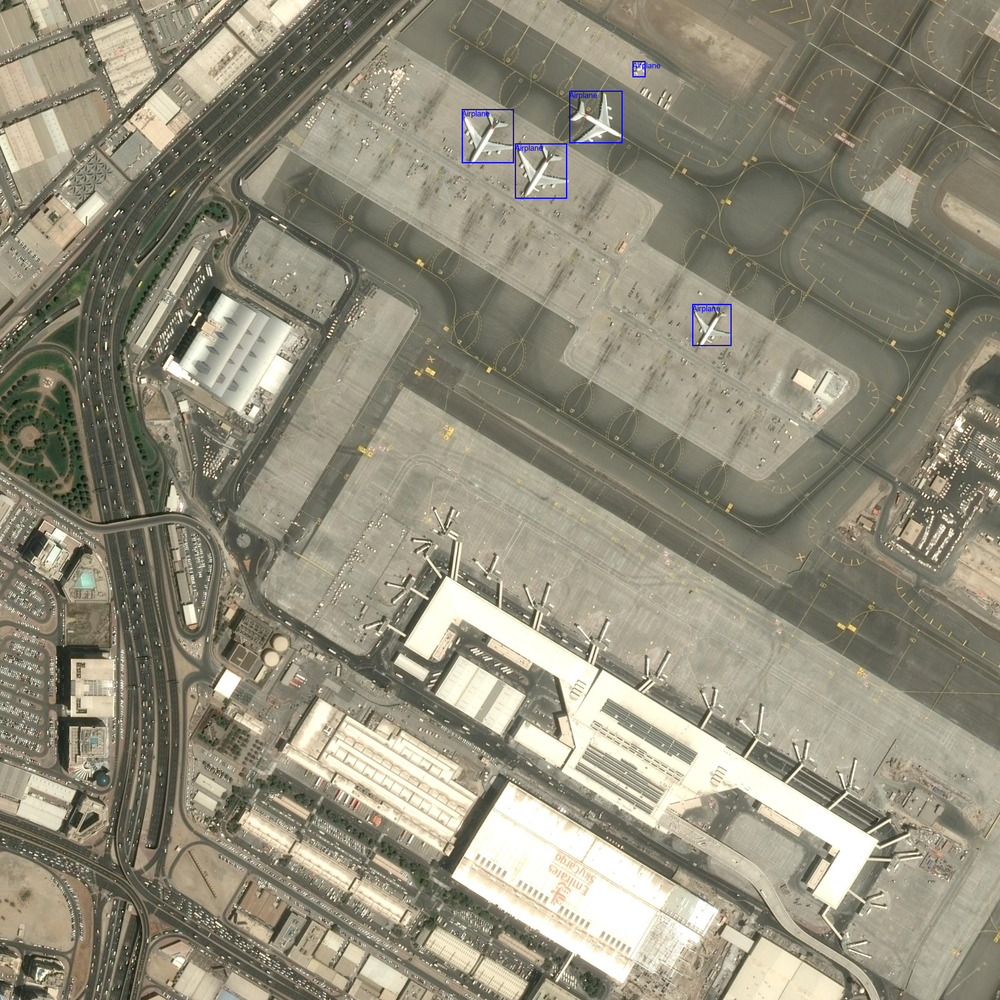

In [25]:
plot_bounding_box(image, annot_list)

Conversion to YOLO annotation has been completed successfully.

---
## End of Pt2
With the images and annotations prepped, we now move on to train the model.

---